## Covid-19 Exploratory Data Analysis

Data Source: ourworldindata.org

Links: https://covid.ourworldindata.org/data/owid-covid-data.xlsx

https://github.com/owid/covid-19-data/tree/master/public/data

Rows: 332499 Columns: 67


In [1]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


### Import Libraries

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

### Load Dataset

In [176]:
# Load the dataset from Google Drive
dataset_path = '/content/drive/My Drive/Covid19_EDA/owid-covid-data.xlsx'
df = pd.read_excel(dataset_path)

df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,age_group
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN,19-30
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN,19-30
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN,19-30
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN,19-30
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN,19-30


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 332499 entries, 0 to 332498
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    332499 non-null  object 
 1   continent                                   316699 non-null  object 
 2   location                                    332499 non-null  object 
 3   date                                        332499 non-null  object 
 4   total_cases                                 295008 non-null  float64
 5   new_cases                                   323383 non-null  float64
 6   new_cases_smoothed                          322124 non-null  float64
 7   total_deaths                                273840 non-null  float64
 8   new_deaths                                  323443 non-null  float64
 9   new_deaths_smoothed                         322213 non-null  float64
 

In [42]:
# List of locations to exclude
locations_to_exclude = ['Low income', 'Lower middle income', 'Asia', 'High income', 'Upper middle income', 'World', 'Africa']
# Drop rows with specified locations
df = df[~df['location'].isin(locations_to_exclude)]

In [44]:
# Convert the 'date' column to datetime
df['date'] = pd.to_datetime(df['date'])

## Trends Over Time


### Q. How have COVID-19 cases and deaths changed over time globally?

The visualization offers a clear depiction of the changing trajectory of COVID-19 cases and deaths on a global scale. The lines representing "Total Cases" and "Total Deaths" show how these counts have evolved over different time periods, providing insight into the dynamics of the pandemic.

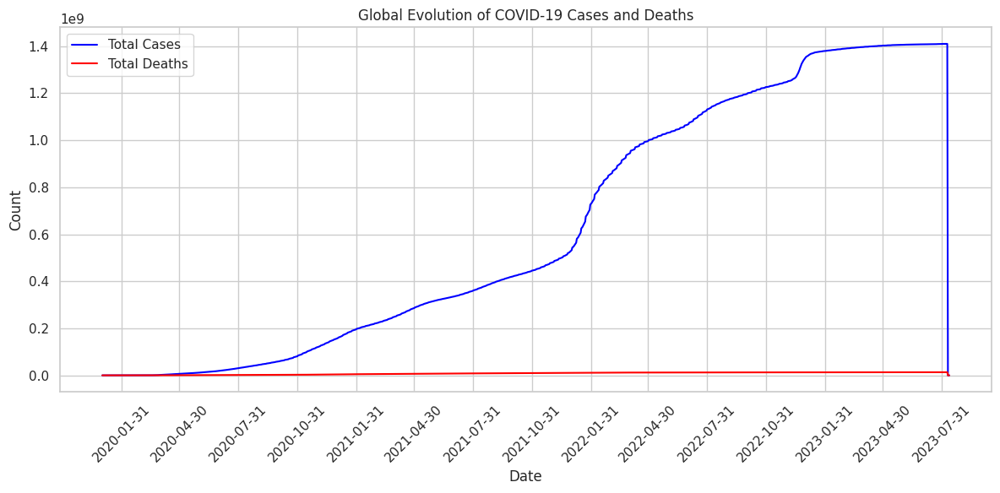

In [177]:
# Group by date and calculate sum of total cases and total deaths
global_cases_deaths = df.groupby('date')[['total_cases', 'total_deaths']].sum().reset_index()

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(global_cases_deaths['date'], global_cases_deaths['total_cases'], label='Total Cases', color='blue')
plt.plot(global_cases_deaths['date'], global_cases_deaths['total_deaths'], label='Total Deaths', color='red')
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('Global Evolution of COVID-19 Cases and Deaths')
plt.legend()
plt.grid(True)
plt.xticks(pd.date_range(start=global_cases_deaths['date'].min(), end=global_cases_deaths['date'].max(), freq='3M'), rotation=45)
plt.tight_layout()

# Display the plot
plt.show()

### Q. When did each country start their COVID-19 vaccination campaigns?

The scatter plot shows the date of the first reported COVID-19 vaccination for each country. Each green point on the plot represents a country, and its horizontal position indicates the date when its vaccination campaign began. This visualization offers a comprehensive overview of the timeline of vaccination initiation across various countries. It enables quick identification of countries that started their vaccination campaigns early versus those that began later. By observing the distribution of points along the time axis, it becomes clear which countries were among the first to initiate their vaccination efforts and which ones followed suit at a later date. This information can provide insights into the preparedness, response speed, and prioritization strategies of different countries in the face of the pandemic.

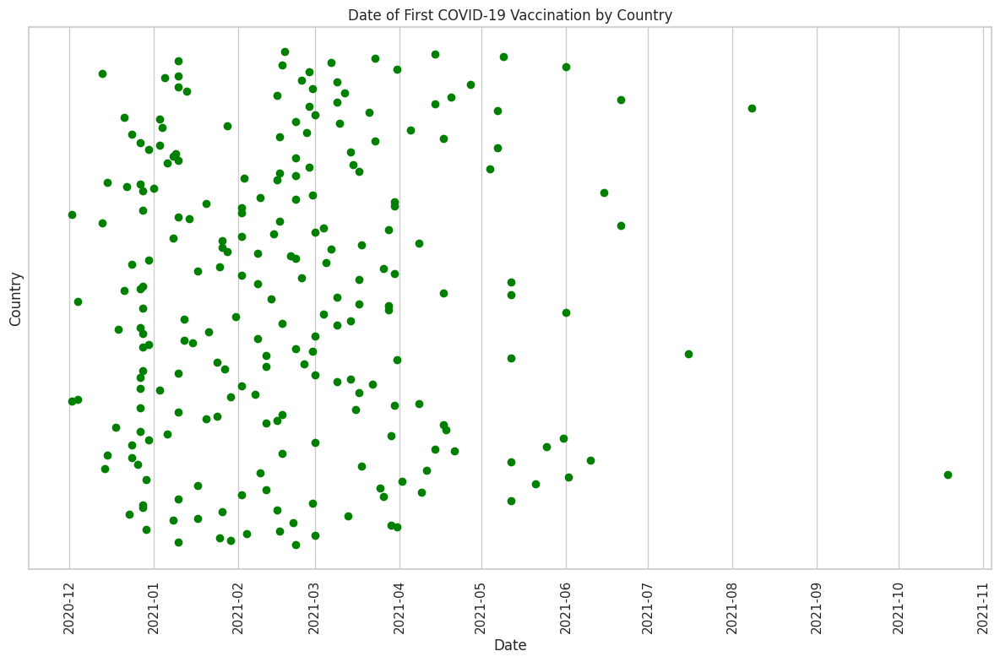

In [141]:
# Filter data to include rows with vaccination start dates
vaccination_data = df.dropna(subset=['location', 'total_vaccinations', 'date'])

# Group data by location and find the date of the first reported vaccination
first_vaccination_dates = vaccination_data.groupby('location')['date'].min()

# Create a scatter plot showing the date of the first reported vaccination for each country
plt.figure(figsize=(12, 8))
plt.scatter(first_vaccination_dates, first_vaccination_dates.index, color='green')
plt.title('Date of First COVID-19 Vaccination by Country')
plt.xlabel('Date')
plt.ylabel('Country')
plt.yticks([])
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Q. What were the peak periods of new COVID-19 cases and deaths?

The line plot depicts the cumulative counts of new COVID-19 cases over time. The blue line represents the number of new cases reported each day. By observing the fluctuations in the line, it becomes evident when the pandemic experienced peak periods of new cases. Peaks in the graph indicate spikes in new cases, showcasing the times when the virus spread most rapidly. The visualization offers a clear and concise understanding of the pandemic's dynamics, highlighting the periods of highest transmission. This information is crucial for understanding the progression of the pandemic, evaluating the effectiveness of interventions, and identifying critical timeframes when healthcare systems might have been under the most strain due to increased case numbers.

<ipython-input-152-e3e2d65bacc8>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



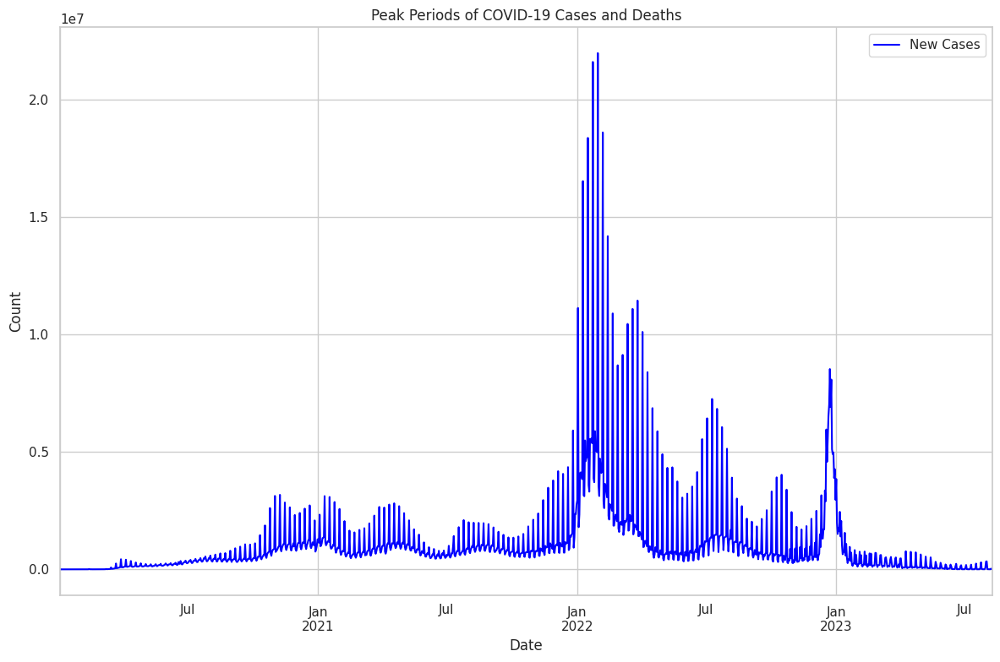

In [152]:
# Filter data to exclude rows with missing values in key columns
filtered_data7 = df.dropna(subset=['date', 'new_cases', 'new_deaths'])

# Convert 'date' column to datetime format
filtered_data7['date'] = pd.to_datetime(filtered_data7['date'])
# Group data by date and calculate the sum of new cases and new deaths
daily_counts = filtered_data7.groupby('date')[['new_cases', 'new_deaths']].sum()

# Plot peak periods of new cases and new deaths
plt.figure(figsize=(12, 8))
daily_counts['new_cases'].plot(label='New Cases', color='blue')
plt.title('Peak Periods of COVID-19 Cases and Deaths')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Geographical Insights

### Q. Which countries have the highest total COVID-19 cases and total deaths?

The two bar plots provide insights into the countries with the highest total COVID-19 cases and total deaths:



*   
Top Countries by Total Cases:
The first bar plot shows the top countries with the highest total COVID-19 cases. Each bar represents a country, and its length corresponds to the total number of cases reported in that country. The visualization allows you to quickly identify the countries with the most significant cumulative case counts.
*   
Top Countries by Total Deaths:
The second bar plot displays the top countries with the highest total COVID-19 deaths. Similar to the first plot, each bar represents a country, and its length represents the total number of deaths reported in that country. This plot helps you identify the countries that have experienced the most significant loss of life due to the pandemic.



In both plots, the bars are arranged in descending order, allowing you to easily compare the severity of the pandemic's impact across different countries. This visualization provides a snapshot of the countries that have been most affected by COVID-19 in terms of total cases and total deaths, helping you understand the global distribution of the pandemic's impact.

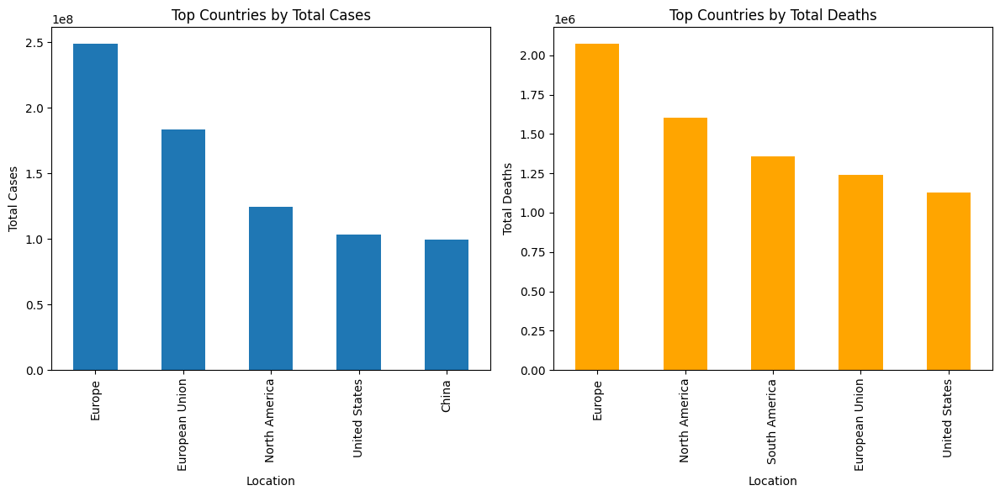

In [57]:
# Group the data by 'location' and calculate the sum of total cases and total deaths
location_stats = df.groupby('location')[['total_cases', 'total_deaths']].max()

# Sort the locations based on total cases
sorted_by_cases = location_stats.sort_values(by='total_cases', ascending=False)

# Sort the locations based on total deaths
sorted_by_deaths = location_stats.sort_values(by='total_deaths', ascending=False)

plt.figure(figsize=(12, 6))

# Bar plot for top countries by total cases
plt.subplot(1, 2, 1)
sorted_by_cases['total_cases'].head().plot(kind='bar')
plt.title('Top Countries by Total Cases')
plt.xlabel('Location')
plt.ylabel('Total Cases')

# Bar plot for top countries by total deaths
plt.subplot(1, 2, 2)
sorted_by_deaths['total_deaths'].head().plot(kind='bar', color='orange')
plt.title('Top Countries by Total Deaths')
plt.xlabel('Location')
plt.ylabel('Total Deaths')

plt.tight_layout()
plt.show()

### Q. How do COVID-19 cases and deaths vary by continent?

The stacked bar plot illustrates the distribution of COVID-19 cases and deaths across different continents:


*    COVID-19 Cases by Continent:
    The plot's bars are divided into sections, each representing a continent. The height of each section corresponds to the total number of COVID-19 cases reported in that continent. By observing the height of each segment, you can identify which continents have experienced the highest total case counts.
*    COVID-19 Deaths by Continent:
    The different colors within each segment of the bars represent COVID-19 deaths within that continent. The visualization allows you to see the proportion of deaths relative to the total cases for each continent. It's possible to compare the distribution of cases and deaths across continents.


   

   

The stacked bar plot provides a visual comparison of COVID-19's impact on different continents in terms of total cases and deaths. It enables you to understand how the pandemic's severity has varied across the globe and which continents have been more significantly affected. The visualization captures the relative proportions of cases and deaths within each continent, offering insights into the pandemic's regional disparities.

<Figure size 1000x600 with 0 Axes>

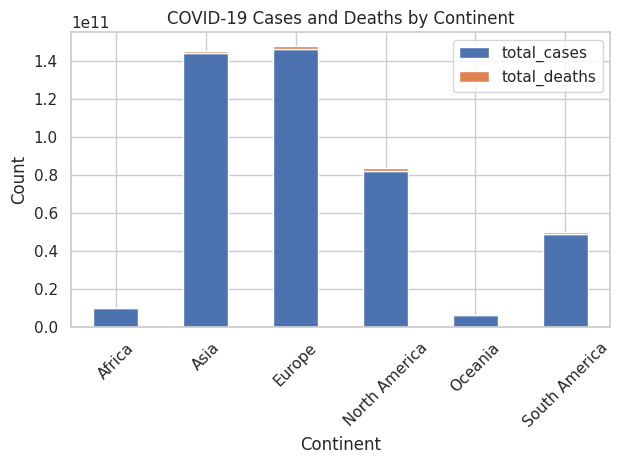

In [138]:
# Filter data to exclude rows with missing values in key columns
filtered_data6 = df.dropna(subset=['continent', 'total_cases', 'total_deaths'])

# Pivot data to create a stacked bar plot
pivot_data = filtered_data6.pivot_table(index='continent', values=['total_cases', 'total_deaths'], aggfunc='sum')

# Create a stacked bar plot
plt.figure(figsize=(10, 6))
pivot_data.plot(kind='bar', stacked=True)
plt.title('COVID-19 Cases and Deaths by Continent')
plt.xlabel('Continent')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Q. What is the relationship between COVID-19 cases and deaths per million population?

The bubble plot effectively visualizes the interplay between COVID-19 cases, deaths, and population for various locations:


   



*   
    Distribution of Locations:
    Each bubble represents a country or location, with its position on the x-axis indicating the number of COVID-19 cases per million population and its position on the y-axis indicating the number of COVID-19 deaths per million population.
*    Bubble Size:
    The size of each bubble corresponds to the population of the respective location, providing a visual indicator of the scale of the pandemic's impact in that region.
*    
    Bubble Color:
    The color of each bubble is determined by its continent, allowing for quick differentiation between different regions.



The log scales on both axes allow for a clear visualization of data across a wide range of values. The overall pattern and distribution of the bubbles reveal insights into how the pandemic has affected different countries based on their population size, with larger bubbles representing more populous nations. This visualization enables comparisons between the severity of the outbreak in terms of cases and deaths while considering the population size as a factor. It also helps identify outliers or countries that have been particularly hard-hit in relation to their population.

In [131]:
# Filter data to exclude rows with missing values in key columns
filtered_data4 = df.dropna(subset=['location', 'total_cases', 'total_deaths', 'population'])

# Calculate cases and deaths per million population
filtered_data4['cases_per_million'] = filtered_data4['total_cases'] / (filtered_data4['population'] / 1000000)
filtered_data4['deaths_per_million'] = filtered_data4['total_deaths'] / (filtered_data4['population'] / 1000000)

# Create a bubble plot using Plotly
fig = px.scatter(filtered_data4, x='cases_per_million', y='deaths_per_million',
                 size='population', color='continent', hover_name='location',
                 log_x=True, log_y=True, size_max=50)

# Customize the layout
fig.update_layout(title='Cases vs Deaths per Million Population',
                  xaxis_title='Cases per Million Population',
                  yaxis_title='Deaths per Million Population')

# Show the plot
fig.show()

<ipython-input-131-c312004cdf31>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data4['cases_per_million'] = filtered_data4['total_cases'] / (filtered_data4['population'] / 1000000)
<ipython-input-131-c312004cdf31>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data4['deaths_per_million'] = filtered_data4['total_deaths'] / (filtered_data4['population'] / 1000000)


### Testing and Positivity Rates

### Q. Is there a correlation between testing rate, COVID-19 cases, and deaths?

The scatter plot offers insights into the relationship between testing rates, COVID-19 cases, and deaths for different locations:

    

*   Testing Rate vs. Cases: Each point on the plot represents a location. The x-axis represents the testing rate per thousand population, while the y-axis represents the total number of COVID-19 cases. The position of each point provides an indication of the testing rate and the corresponding number of cases. Points clustered towards the bottom left might indicate locations with lower testing rates and potentially fewer reported cases.
*   Testing Rate vs. Deaths:
    Similar to the previous scenario, the scatter plot also depicts the relationship between testing rates and the total number of COVID-19 deaths. The y-axis represents the total deaths count, and the position of points on the plot indicates the testing rate and associated death count. Points clustered towards the bottom left could indicate locations with lower testing rates and, consequently, fewer reported deaths.


   

    

By using log scales on both axes, the visualization enables a clear view of the data across a wide range of values. The plot allows you to examine potential correlations between higher testing rates, the number of reported cases, and the number of reported deaths. The overlapping of points and patterns in the scatter plot can provide insights into whether increased testing rates are associated with a higher count of cases and deaths or if other factors contribute to the variations observed.

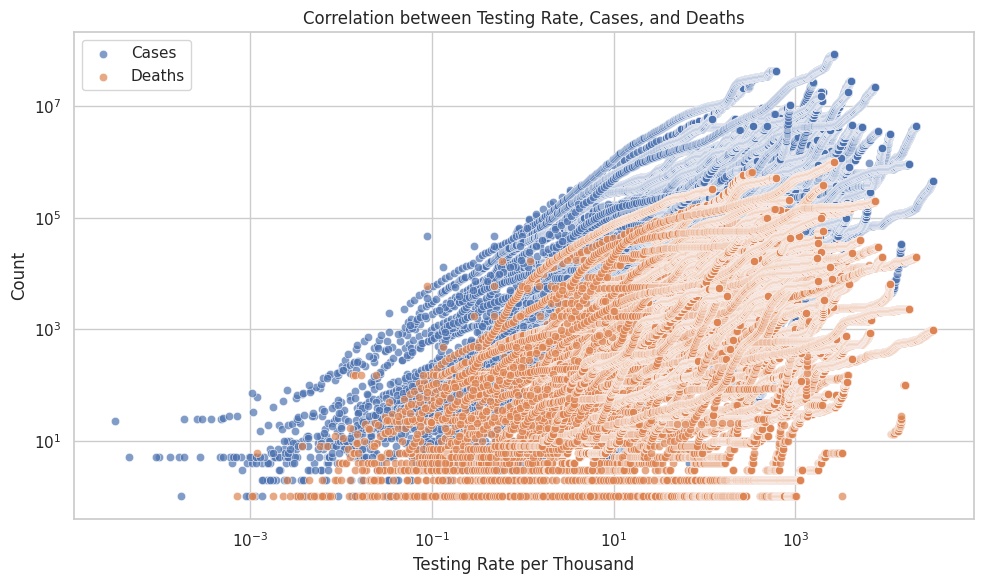

In [82]:
# Filter out rows with missing testing or population data
filtered_df = df.dropna(subset=['total_tests', 'population'])

filtered_df['testing_rate_per_thousand'] = (filtered_df['total_tests'] / filtered_df['population']) * 1000

plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_df, x='testing_rate_per_thousand', y='total_cases', alpha=0.7, label='Cases')
sns.scatterplot(data=filtered_df, x='testing_rate_per_thousand', y='total_deaths', alpha=0.7, label='Deaths')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Testing Rate per Thousand')
plt.ylabel('Count')
plt.title('Correlation between Testing Rate, Cases, and Deaths')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Q. How has the positivity rate of COVID-19 tests evolved over time?

The line plot illustrates the trend of the positivity rate of COVID-19 tests over a certain period:


*       Positivity Rate Over Time:
    The x-axis represents time, specifically the dates on which the data was collected. The y-axis represents the positivity rate, expressed as a percentage. Each point on the line plot indicates the positivity rate of COVID-19 tests on a specific date. The line connects these points to show the trend in the positivity rate over time.
*   
    Marker Points:
    The circular markers (represented by 'o') on the line provide additional emphasis on the data points, making it easier to track the changes in positivity rate on individual dates.





By observing the line's trajectory, you can gain insights into how the positivity rate has changed throughout the given time frame. An upward trend in the line indicates an increase in the percentage of positive COVID-19 tests, potentially indicating a rise in infections. Conversely, a declining trend suggests a decrease in the percentage of positive tests. This information is essential for understanding how the virus has spread over time and how the effectiveness of testing and control measures has evolved.

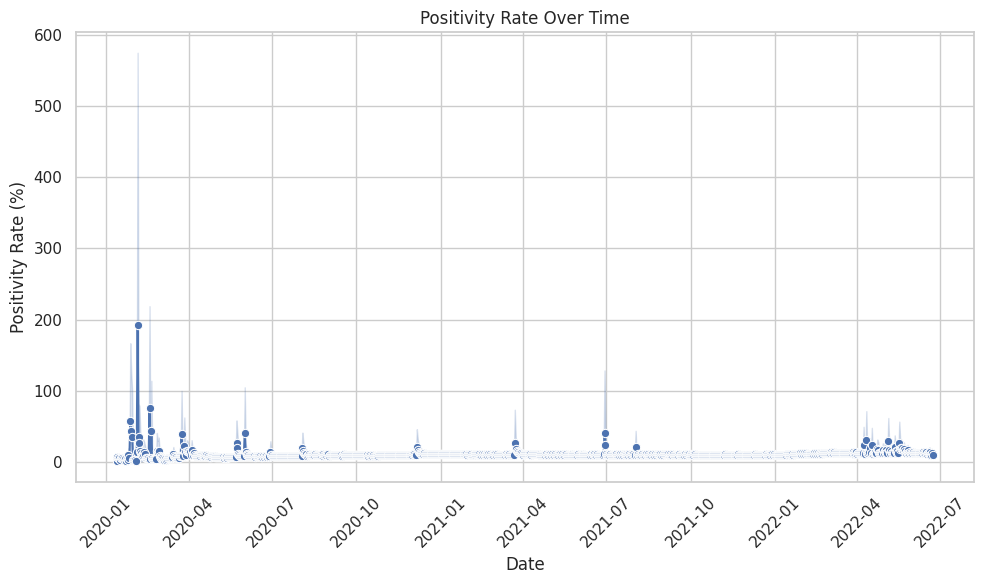

In [84]:
filtered_df['positivity_rate'] = (filtered_df['total_cases'] / filtered_df['total_tests']) * 100

plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_df, x='date', y='positivity_rate', marker='o')
plt.xlabel('Date')
plt.ylabel('Positivity Rate (%)')
plt.title('Positivity Rate Over Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

## Vaccination Insights

### The visualization created provides insights into the relationship between COVID-19 new cases, new deaths, and vaccination rates over time.


    

*   
    New Cases and Vaccination Rate Over Time:
    The left subplot displays two line plots. The blue line represents the trend of new COVID-19 cases over time, with each data point indicating the count of new cases on a specific date. The orange line represents the trend of the vaccination rate per thousand population over time. By observing these lines, you can identify potential correlations between the increase or decrease in new cases and changes in the vaccination rate. A decrease in new cases might coincide with an increase in the vaccination rate, reflecting the effectiveness of vaccination in reducing infections.
*   New Deaths and Vaccination Rate Over Time:
    The right subplot similarly presents two line plots. The red line depicts the trend of new COVID-19 deaths over time, with each data point representing the count of new deaths on a specific date. The green line represents the trend of the vaccination rate per thousand population over time. Analyzing these lines can reveal any possible patterns between changes in new deaths and fluctuations in the vaccination rate. A decrease in new deaths might align with higher vaccination rates, indicating that vaccination efforts contribute to minimizing severe outcomes.



By observing both subplots simultaneously, you can compare the trends in new cases, new deaths, and vaccination rates. This visualization allows you to evaluate the impact of vaccination campaigns on the incidence of new cases and deaths, providing valuable insights into the ongoing efforts to combat the pandemic.
Free Research Preview. ChatGPT may produce inaccurate information about people, places, or facts. ChatGPT August 3 Version

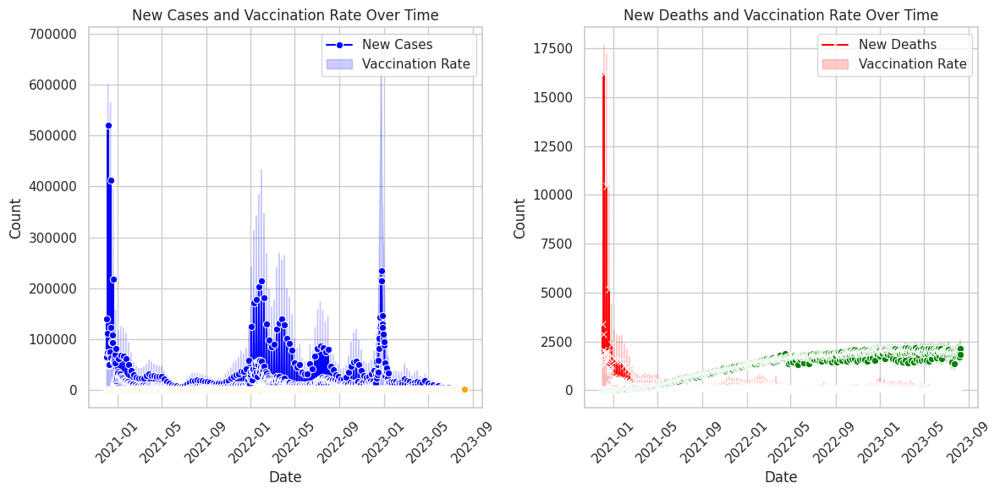

In [90]:
# Filter out rows with missing vaccination or case/death data
filtered_df1 = df.dropna(subset=['total_vaccinations', 'new_cases', 'new_deaths'])

filtered_df1['vaccination_rate_per_thousand'] = (filtered_df1['total_vaccinations'] / filtered_df1['population']) * 1000

plt.figure(figsize=(12, 6))

# Line plot for new cases
plt.subplot(1, 2, 1)
sns.lineplot(data=filtered_df1, x='date', y='new_cases', marker='o', color='blue')
sns.lineplot(data=filtered_df1, x='date', y='vaccination_rate_per_thousand', marker='o', color='orange')
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('New Cases and Vaccination Rate Over Time')
plt.xticks(rotation=45)
plt.legend(['New Cases', 'Vaccination Rate'])

# Line plot for new deaths
plt.subplot(1, 2, 2)
sns.lineplot(data=filtered_df1, x='date', y='new_deaths', marker='x', color='red')
sns.lineplot(data=filtered_df1, x='date', y='vaccination_rate_per_thousand', marker='o', color='green')
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('New Deaths and Vaccination Rate Over Time')
plt.xticks(rotation=45)
plt.legend(['New Deaths', 'Vaccination Rate'])

plt.tight_layout()
plt.show()

### Q. How does the total number of people vaccinated relate to the percentage of the population that has been vaccinated across different countries?

The scatter plot showcases each country's position on the graph based on two key metrics:


*   
    Total People Vaccinated (x-axis):
    The logarithmic scale on the x-axis allows for clear representation of a wide range of total vaccinated individuals in each country. Countries with a higher total number of people vaccinated are positioned farther to the right.
*   
    Percentage of Population Vaccinated (y-axis):
    The y-axis represents the percentage of a country's population that has been vaccinated. Points higher on the y-axis indicate a larger proportion of the population that has received the vaccine.




From this visualization, you can derive the following insights:

    

*   Vaccination Progress: Countries positioned higher on the y-axis have achieved a higher percentage of their population being vaccinated. This provides an indication of the progress various countries have made in their vaccination campaigns.

*   
    Vaccination Intensity: Countries positioned farther to the right on the x-axis have a higher total number of vaccinated individuals. This indicates the intensity of vaccination efforts and the absolute number of people who have received the vaccine.
*    Variability: The distribution of points across the scatter plot highlights the variability in vaccination coverage among different countries. Some countries have achieved high percentages of population vaccination despite varying total vaccinated numbers.




    


   

In summary, the scatter plot offers a comprehensive view of how different countries compare in terms of both the total number of people vaccinated and the percentage of their population that has been vaccinated. This information is valuable for assessing the effectiveness and reach of vaccination campaigns across the globe.


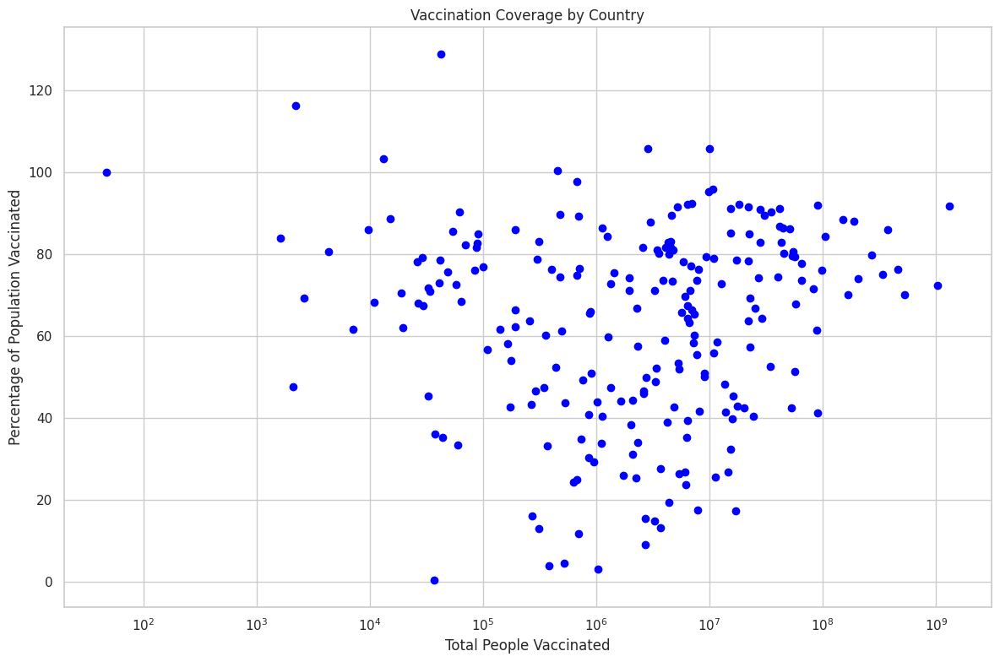

In [150]:
# Filter data to include rows with vaccination information
vaccination_data = df.dropna(subset=['location', 'people_vaccinated', 'population'])

# Calculate total number of people vaccinated and percentage of population vaccinated
vaccination_summary = vaccination_data.groupby('location').agg(
    total_vaccinated=('people_vaccinated', 'max'),
    population=('population', 'max')
)

vaccination_summary['percentage_vaccinated'] = (vaccination_summary['total_vaccinated'] / vaccination_summary['population']) * 100

# Create a scatter plot
plt.figure(figsize=(12, 8))
plt.scatter(vaccination_summary['total_vaccinated'], vaccination_summary['percentage_vaccinated'], color='blue')
plt.title('Vaccination Coverage by Country')
plt.xlabel('Total People Vaccinated')
plt.ylabel('Percentage of Population Vaccinated')
plt.xscale('log')
plt.grid(True)
plt.tight_layout()


plt.show()

### Q. Which are the top 10 countries with the highest percentage of total people vaccinated?

The pie chart visually displays the distribution of total vaccinated individuals among the top 10 countries. Each slice of the pie represents a country, and its size is proportional to the percentage of the total vaccinated individuals within that country. The labels on the chart indicate the names of the respective countries, and the percentage values are shown inside each slice.

From this visualization, you can gather the following insights:


*   
    Top Vaccinating Countries: The chart clearly identifies the top 10 countries that have achieved the highest percentage of total people vaccinated. Each slice's size indicates the relative proportion of total vaccinated individuals for each country within the top 10 list.
*   

    Relative Contributions: By observing the sizes of the slices, you can compare the vaccination achievements among these top 10 countries. The larger slices represent countries that have made significant progress in vaccinating a substantial portion of their population.
*   

    Visualizing Percentages: The pie chart provides a visual representation of the distribution of vaccination progress, allowing you to quickly identify which countries are leading in terms of vaccinating their population.




In summary, the pie chart offers a concise and visually appealing way to understand the distribution of total vaccinated individuals among the top 10 countries and their respective contributions to the global vaccination effort.

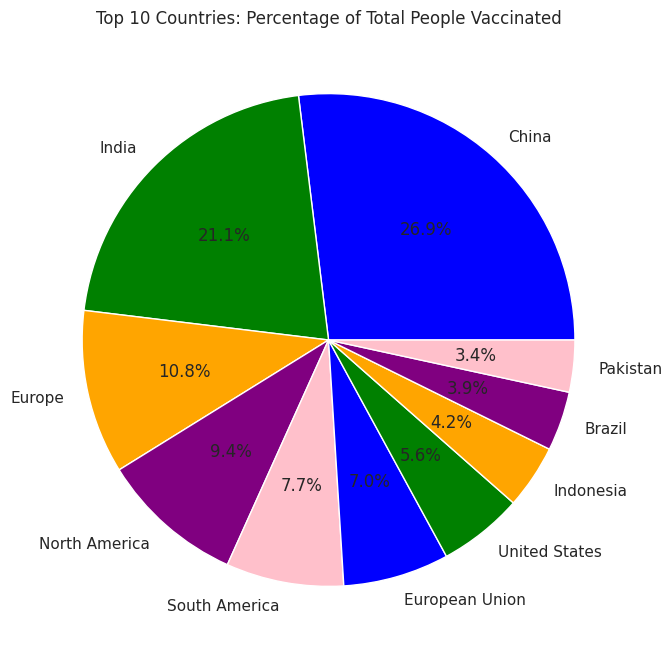

In [149]:
# Calculate total number of people vaccinated and percentage of population vaccinated
vaccination_summary = vaccination_data.groupby('location').agg(
    total_vaccinated=('people_vaccinated', 'max'),
    population=('population', 'max')
)

vaccination_summary['percentage_vaccinated'] = (vaccination_summary['total_vaccinated'] / vaccination_summary['population']) * 100

# Get top 5 countries by total vaccinated
top_countries = vaccination_summary.sort_values(by='total_vaccinated', ascending=False).head(10)

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_countries['total_vaccinated'], labels=top_countries.index, autopct='%.1f%%', colors=['blue', 'green', 'orange', 'purple', 'pink'])
plt.title('Top 10 Countries: Percentage of Total People Vaccinated')
plt.show()

### Gender and Smoking Habits

### Q. Is there a correlation between smoking rates and COVID-19 case and death rates?

The pair of scatter plots visually represent the relationship between smoking rates (both female and male) and the mean COVID-19 case rates per million people (left plot) and mean COVID-19 death rates per million people (right plot). Each point on the scatter plot corresponds to a specific combination of female and male smoking rates, and its position indicates the corresponding mean case or death rate.

From these visualizations, you can gather the following insights:

Case Rate Analysis: In the left scatter plot, the distribution of points shows the relationship between smoking rates and mean COVID-19 case rates. Points representing different combinations of female and male smoking rates are scattered across the plot. By observing the distribution of points, you can infer whether higher smoking rates correspond to higher mean case rates.

Death Rate Analysis: Similarly, in the right scatter plot, points represent the relationship between smoking rates and mean COVID-19 death rates. This plot helps you understand whether regions with higher smoking rates experience higher mean death rates due to COVID-19.

Comparison by Gender: The scatter plots distinguish between female and male smoking rates using different colors (blue for female and orange for male). This allows you to compare the impact of smoking rates on COVID-19 outcomes for different genders.

Trend Observations: By examining the trend of the scatter points, you can identify any patterns or trends indicating whether there's a correlation between smoking rates and COVID-19 case or death rates.

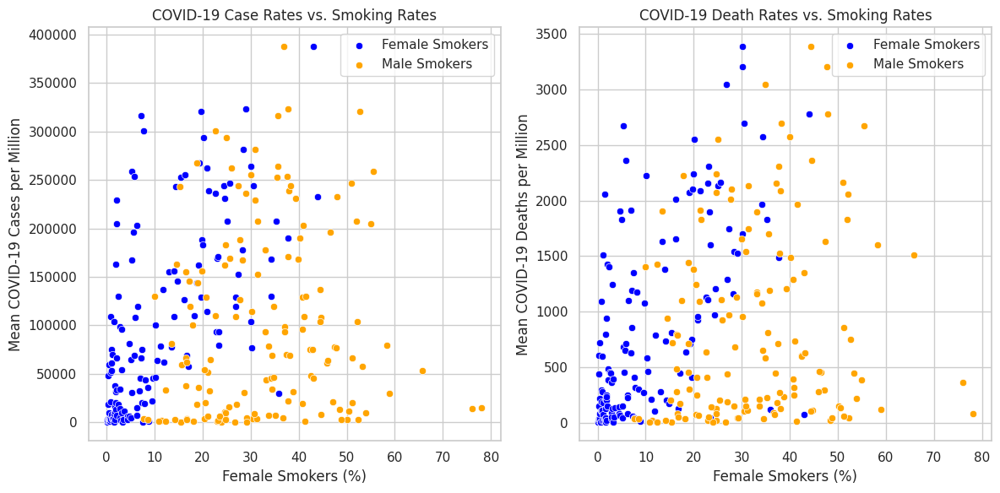

In [159]:
# Filter data to include relevant columns
filtered_data = df.dropna(subset=['location', 'female_smokers', 'male_smokers', 'total_cases_per_million', 'total_deaths_per_million'])

# Group data by smoking rates and calculate the mean of case rates and death rates
smoking_data = filtered_data.groupby(['female_smokers', 'male_smokers']).agg({
    'total_cases_per_million': 'mean',
    'total_deaths_per_million': 'mean'
}).reset_index()

# Create visualizations
plt.figure(figsize=(12, 6))

# Scatter plot comparing case rates between female smokers and male smokers
plt.subplot(1, 2, 1)
sns.scatterplot(data=smoking_data, x='female_smokers', y='total_cases_per_million', color='blue', label='Female Smokers')
sns.scatterplot(data=smoking_data, x='male_smokers', y='total_cases_per_million', color='orange', label='Male Smokers')
plt.xlabel('Female Smokers (%)')
plt.ylabel('Mean COVID-19 Cases per Million')
plt.legend()
plt.title('COVID-19 Case Rates vs. Smoking Rates')

# Scatter plot comparing death rates between female smokers and male smokers
plt.subplot(1, 2, 2)
sns.scatterplot(data=smoking_data, x='female_smokers', y='total_deaths_per_million', color='blue', label='Female Smokers')
sns.scatterplot(data=smoking_data, x='male_smokers', y='total_deaths_per_million', color='orange', label='Male Smokers')
plt.xlabel('Female Smokers (%)')
plt.ylabel('Mean COVID-19 Deaths per Million')
plt.legend()
plt.title('COVID-19 Death Rates vs. Smoking Rates')

plt.tight_layout()
plt.show()

### Age Groups and Vulnerability

### Q. How does the proportion of the population aged 65 or older or 70 or older relate to COVID-19 death rates?

The pair of scatter plots presented in the visualization explore the potential connection between the percentage of a country's population aged 65 or older (left plot) and aged 70 or older (right plot) with the COVID-19 death rates observed in those countries. Each point on the scatter plot represents a specific country and provides a visual representation of the interplay between the proportion of elderly individuals and COVID-19 death rates.

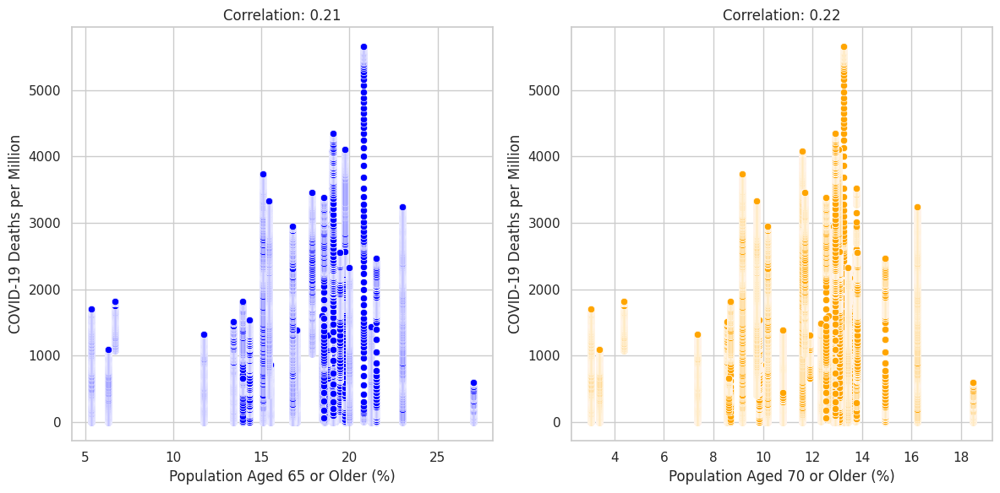

In [167]:
# Filter data to include relevant columns
filtered_data = df.dropna(subset=['location', 'aged_65_older', 'aged_70_older', 'total_cases_per_million', 'total_deaths_per_million', 'hosp_patients_per_million'])

# Calculate correlations between age groups and death rates
correlation_65 = filtered_data['aged_65_older'].corr(filtered_data['total_deaths_per_million'])
correlation_70 = filtered_data['aged_70_older'].corr(filtered_data['total_deaths_per_million'])

# Create visualizations
plt.figure(figsize=(12, 6))

# Scatter plot of aged_65_older vs. total_deaths_per_million
plt.subplot(1, 2, 1)
sns.scatterplot(data=filtered_data, x='aged_65_older', y='total_deaths_per_million', color='blue')
plt.xlabel('Population Aged 65 or Older (%)')
plt.ylabel('COVID-19 Deaths per Million')
plt.title(f'Correlation: {correlation_65:.2f}')

# Scatter plot of aged_70_older vs. total_deaths_per_million
plt.subplot(1, 2, 2)
sns.scatterplot(data=filtered_data, x='aged_70_older', y='total_deaths_per_million', color='orange')
plt.xlabel('Population Aged 70 or Older (%)')
plt.ylabel('COVID-19 Deaths per Million')
plt.title(f'Correlation: {correlation_70:.2f}')

plt.tight_layout()
plt.show()

### Health Factors and COVID-19 Outcomes

### Q. How does the distribution of age groups relate to COVID-19 infection and severity rates?

The two scatter plots shown in the visualization investigate the potential connection between the distribution of age groups within a country and the corresponding COVID-19 infection and severity rates. The data has been categorized into distinct age groups, each represented by a range of ages. The x-axis of each scatter plot represents the median age of a country's population within each age group, while the y-axis portrays either the infection rate (total cases per million) or the severity rate (total deaths per million).

<ipython-input-107-5dd0dd7149c0>:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  age_grouped = df.groupby('age_group').mean()


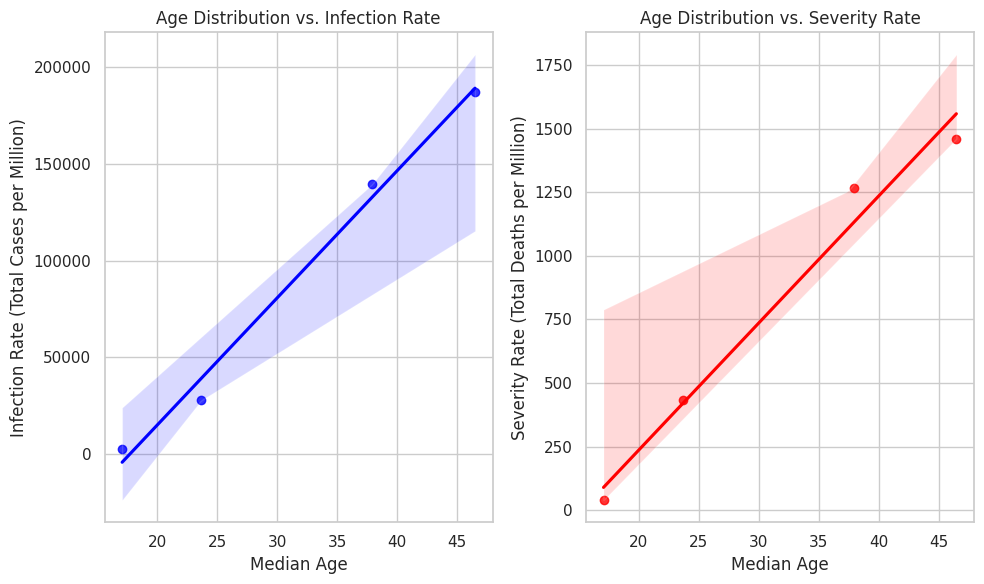

In [107]:
# Group COVID-19 data by age group and calculate infection and severity rates
age_bins = [0, 18, 30, 45, 60, 100]  # Define age bins
age_labels = ['0-18', '19-30', '31-45', '46-60', '61+']  # Labels for age groups
df['age_group'] = pd.cut(df['median_age'], bins=age_bins, labels=age_labels)

age_grouped = df.groupby('age_group').mean()

# Create scatter plots with regression lines
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
sns.regplot(x='median_age', y='total_cases_per_million', data=age_grouped, color='blue')
plt.xlabel('Median Age')
plt.ylabel('Infection Rate (Total Cases per Million)')
plt.title('Age Distribution vs. Infection Rate')

plt.subplot(1, 2, 2)
sns.regplot(x='median_age', y='total_deaths_per_million', data=age_grouped, color='red')
plt.xlabel('Median Age')
plt.ylabel('Severity Rate (Total Deaths per Million)')
plt.title('Age Distribution vs. Severity Rate')

plt.tight_layout()
plt.show()

### Q. How are health factors such as median age, diabetes prevalence, and cardiovascular death rate correlated with the severity of COVID-19 outcomes?


The heatmap visualization showcases the correlation between various health factors and the severity of COVID-19 outcomes, as measured by the chosen severity metric (e.g., total cases). The heatmap's cells display correlation coefficients, ranging from -1 to 1. A positive correlation coefficient suggests a direct relationship, whereas a negative coefficient implies an inverse relationship. The closer the coefficient is to 1 or -1, the stronger the correlation.

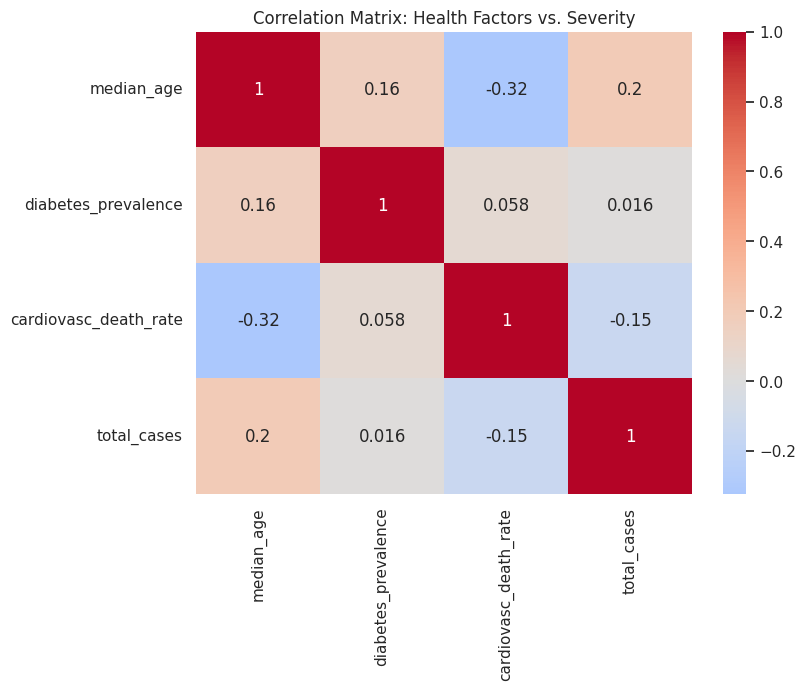

In [101]:
# Filter out rows with missing data for relevant columns
filtered_df2 = df.dropna(subset=['median_age', 'diabetes_prevalence', 'cardiovasc_death_rate', 'total_cases', 'total_deaths'])

# Define the severity metric (e.g., total cases)
severity_metric = filtered_df2['total_cases']

# Calculate correlation coefficients
correlation_age = severity_metric.corr(filtered_df2['median_age'])
correlation_diabetes = severity_metric.corr(filtered_df2['diabetes_prevalence'])
correlation_cardio = severity_metric.corr(filtered_df2['cardiovasc_death_rate'])

# Create a correlation matrix
correlation_matrix = filtered_df2[['median_age', 'diabetes_prevalence', 'cardiovasc_death_rate', 'total_cases']].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix: Health Factors vs. Severity')
plt.show()


### Weekly Admissions and Healthcare Strain

### Q. How does the availability of hospital beds per thousand people relate to the average mortality rate in different healthcare capacity categories?


The bar plot visualization illustrates the relationship between the availability of hospital beds per thousand people and the average mortality rate, which indicates the severity of COVID-19 outcomes, across various healthcare capacity categories. Healthcare capacity categories are defined based on ranges of hospital beds per thousand people. The x-axis represents these categories, while the y-axis represents the average total deaths.

<ipython-input-105-1d1562c48657>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df3['beds_category'] = pd.cut(filtered_df3['hospital_beds_per_thousand'], bins=bins, labels=labels)


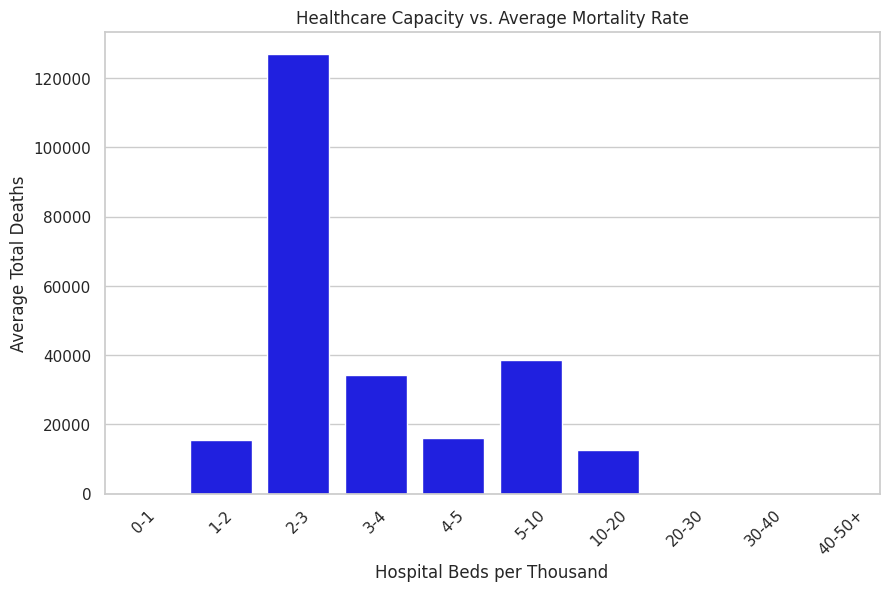

In [105]:
# Filter out rows with missing data for relevant columns
filtered_df3 = df.dropna(subset=['hospital_beds_per_thousand', 'icu_patients', 'total_deaths'])

# Define categories or ranges for hospital beds per thousand
bins = [0, 1, 2, 3, 4, 5, 10, 20, 30, 40, 50]  # Customize these bins as needed
labels = ['0-1', '1-2', '2-3', '3-4', '4-5', '5-10', '10-20', '20-30', '30-40', '40-50+']

# Apply the categories to the dataset
filtered_df3['beds_category'] = pd.cut(filtered_df3['hospital_beds_per_thousand'], bins=bins, labels=labels)

# Calculate average mortality rate for each category
avg_mortality_by_category = filtered_df3.groupby('beds_category')['total_deaths'].mean().reset_index()

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(data=avg_mortality_by_category, x='beds_category', y='total_deaths', color='blue')
plt.xlabel('Hospital Beds per Thousand')
plt.ylabel('Average Total Deaths')
plt.title('Healthcare Capacity vs. Average Mortality Rate')
plt.xticks(rotation=45)
plt.show()

### Q. Is there a relationship between the availability of handwashing facilities and the transmission rates of COVID-19, as indicated by the total cases per million population?

The visualization provides insights into this question by presenting a scatter plot that illustrates the potential correlation between the presence of handwashing facilities and the prevalence of COVID-19 cases. The regression line within the scatter plot offers an additional perspective on the trend.

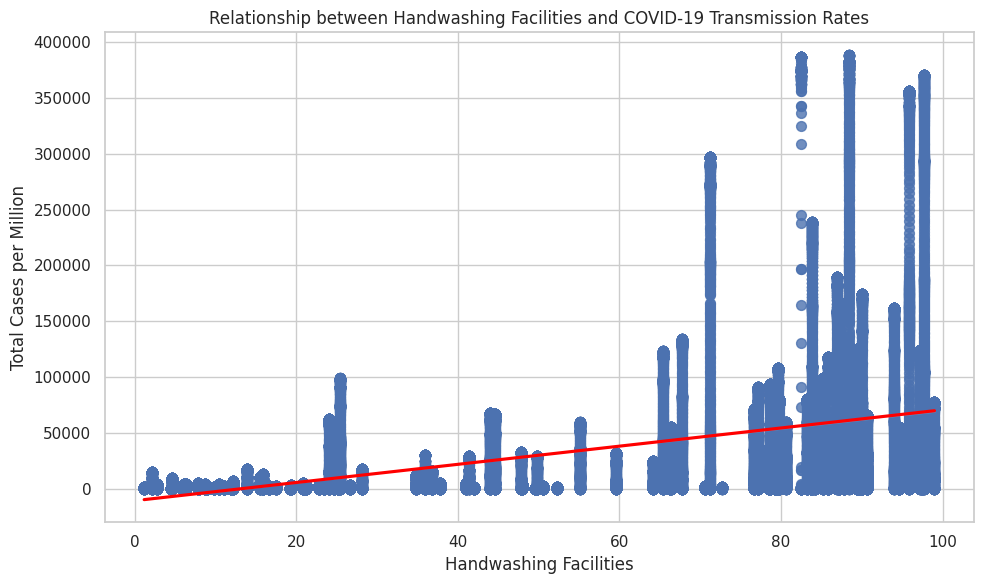

In [168]:
# Filter data to include relevant columns
filtered_data = df.dropna(subset=['location', 'handwashing_facilities', 'total_cases_per_million'])

# Create a scatter plot with a regression line
plt.figure(figsize=(10, 6))

sns.regplot(data=filtered_data, x='handwashing_facilities', y='total_cases_per_million', scatter_kws={'s': 50}, line_kws={'color': 'red'})

plt.xlabel('Handwashing Facilities')
plt.ylabel('Total Cases per Million')
plt.title('Relationship between Handwashing Facilities and COVID-19 Transmission Rates')
plt.grid(True)

plt.tight_layout()
plt.show()

### Q. How have weekly admissions to ICU and hospitals changed over time?

The line plot visualizes the trends in weekly admissions to both ICU (Intensive Care Unit) and hospitals over a certain period:

Weekly ICU and Hospital Admissions:
The x-axis of the plot represents time, specifically the dates on which the data was recorded. The y-axis represents the number of weekly admissions. The blue line represents the weekly ICU admissions, while the orange line represents the weekly hospital admissions. Each point on the lines corresponds to a specific date, showing the number of admissions to ICU and hospitals on that date.

Interpretation:
By observing the trajectory of the two lines, you can gain insights into how weekly admissions to both ICU and hospitals have changed over the given time frame. Upward trends in the lines indicate an increase in the number of weekly admissions, suggesting a potential surge in severe cases of COVID-19 requiring ICU care or hospitalization. Conversely, downward trends imply a decrease in admissions, indicating a potential decline in the severity of cases.

This visualization is crucial for understanding the burden on healthcare facilities and the impact of the pandemic on healthcare systems over time. It helps track fluctuations in hospital resource utilization and provides valuable information for healthcare planning and response strategies.

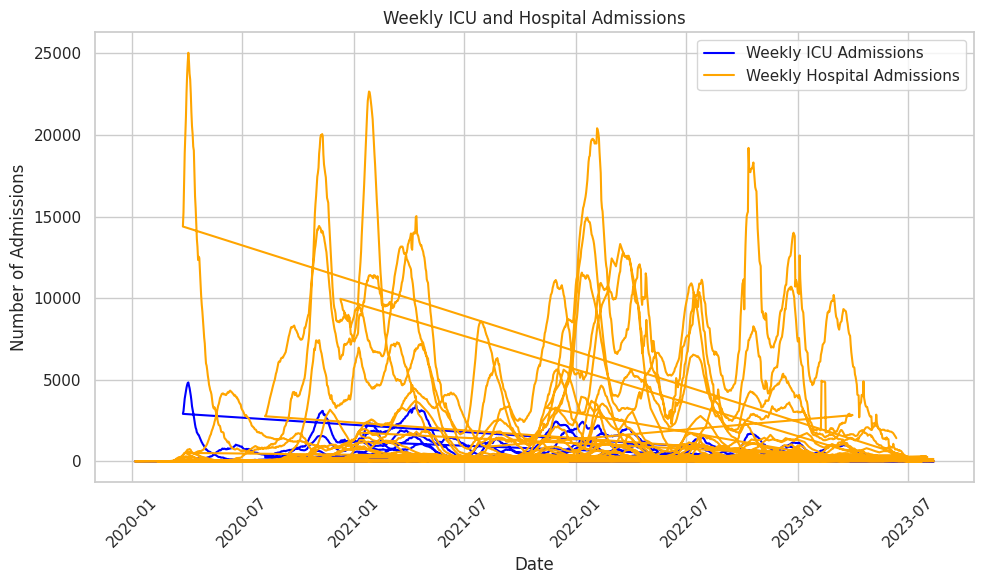

In [174]:
# Filter data to exclude rows with missing values in key columns
filtered_data = df.dropna(subset=['date', 'weekly_icu_admissions', 'weekly_hosp_admissions'])

# Create a line plot
plt.figure(figsize=(10, 6))

plt.plot(filtered_data['date'], filtered_data['weekly_icu_admissions'], label='Weekly ICU Admissions', color='blue')
plt.plot(filtered_data['date'], filtered_data['weekly_hosp_admissions'], label='Weekly Hospital Admissions', color='orange')

plt.xlabel('Date')
plt.ylabel('Number of Admissions')
plt.title('Weekly ICU and Hospital Admissions')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)

plt.tight_layout()
plt.show()

### Stringency Measures and Cases

### Q. How does the stringency index relate to the progression of COVID-19 cases and deaths over time?

Progression of New Cases and Stringency Index:
The left plot depicts the progression of new COVID-19 cases (blue line) alongside the stringency index (red line) over time. The x-axis represents dates, while the y-axis on the left side corresponds to the count of new cases. The y-axis on the right side represents the stringency index, which quantifies the strictness of government measures. The blue line shows the trend of new cases, while the red line shows the variations in the stringency index. By examining this plot, you can identify potential correlations between changes in the stringency index and fluctuations in new case counts.

Progression of Total Deaths and Stringency Index:
The right plot displays the progression of total COVID-19 deaths (blue line) in conjunction with the stringency index (red line) over time. Similar to the left plot, the x-axis represents dates, and the y-axes represent counts (total deaths on the left and stringency index on the right). The blue line indicates the trend of total deaths, while the red line represents the stringency index. This plot enables you to explore potential relationships between the stringency index and variations in the total death count.

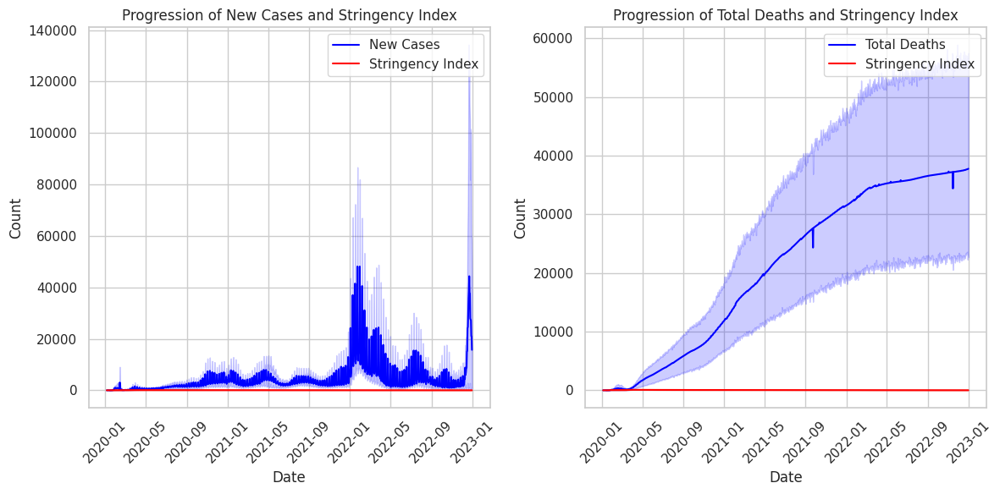

In [106]:
# Filter out rows with missing data for stringency index and relevant metrics
filtered_df4 = df.dropna(subset=['stringency_index', 'new_cases', 'total_deaths'])
# Create line plots for progression and stringency
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.lineplot(data=filtered_df4, x='date', y='new_cases', label='New Cases', color='blue')
sns.lineplot(data=filtered_df4, x='date', y='stringency_index', label='Stringency Index', color='red')
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('Progression of New Cases and Stringency Index')
plt.xticks(rotation=45)
plt.legend()

plt.subplot(1, 2, 2)
sns.lineplot(data=filtered_df4, x='date', y='total_deaths', label='Total Deaths', color='blue')
sns.lineplot(data=filtered_df4, x='date', y='stringency_index', label='Stringency Index', color='red')
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('Progression of Total Deaths and Stringency Index')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

### Socioeconomic Factors and Pandemic Impact

### Q. How does the average COVID-19 impact (total cases and total deaths per million) vary across different GDP groups?

The bar plot illustrates the relationship between GDP groups and the average COVID-19 impact in terms of total cases and total deaths per million:

Average Total Cases and Deaths per Million by GDP Group:
The x-axis represents GDP groups, which categorize countries based on their GDP per capita. The y-axis indicates the average count per million population, with two bars for each GDP group. The sky blue bars represent the average total cases per million, while the salmon-colored bars represent the average total deaths per million.

By analyzing this plot, you can discern trends related to the relationship between a country's economic prosperity (as measured by GDP per capita) and its COVID-19 impact. Countries are grouped into four categories (Low, Medium, High, Very High) based on their GDP per capita. The plot enables you to compare the average total cases and total deaths per million in each GDP group. For instance, you can identify whether countries with higher GDPs have experienced different levels of COVID-19 impact compared to those with lower GDPs. The visualization provides insights into how economic factors might be associated with the severity of the pandemic's impact in different regions.

<ipython-input-112-dc53637b5ee2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.dropna(subset=['gdp_per_capita', 'total_cases_per_million', 'total_deaths_per_million', 'stringency_index'], inplace=True)
<ipython-input-112-dc53637b5ee2>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['gdp_group'] = pd.cut(data['gdp_per_capita'], bins=bins, labels=labels)


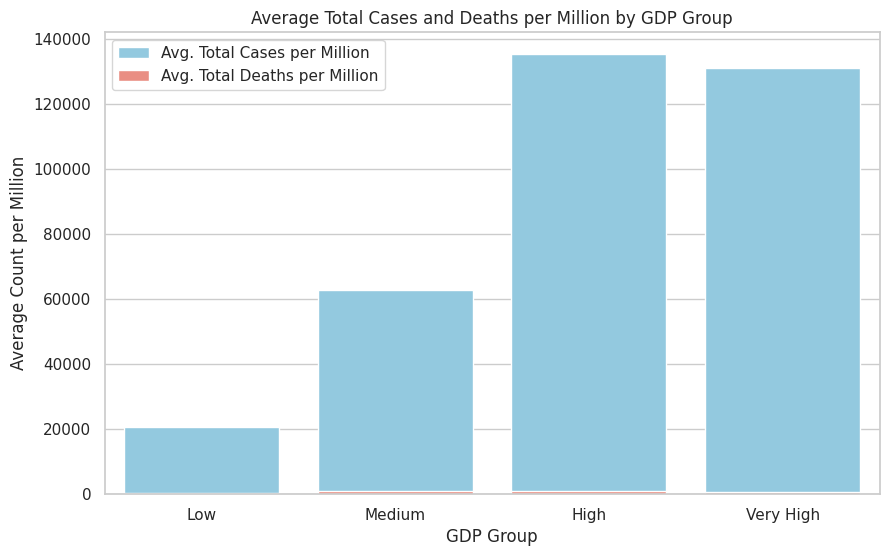

In [112]:
# Extract relevant columns for analysis
data = df[['location', 'gdp_per_capita', 'total_cases_per_million', 'total_deaths_per_million', 'stringency_index']]

# Remove rows with missing values in relevant columns
data.dropna(subset=['gdp_per_capita', 'total_cases_per_million', 'total_deaths_per_million', 'stringency_index'], inplace=True)

# Categorize GDP per capita into groups
bins = [0, 10000, 25000, 50000, float('inf')]
labels = ['Low', 'Medium', 'High', 'Very High']
data['gdp_group'] = pd.cut(data['gdp_per_capita'], bins=bins, labels=labels)

# Calculate average metrics per GDP group
average_metrics = data.groupby('gdp_group')[['total_cases_per_million', 'total_deaths_per_million']].mean().reset_index()

# Bar plot: Average Total Cases and Deaths per Million by GDP Group
plt.figure(figsize=(10, 6))
sns.barplot(data=average_metrics, x='gdp_group', y='total_cases_per_million', color='skyblue', label='Avg. Total Cases per Million')
sns.barplot(data=average_metrics, x='gdp_group', y='total_deaths_per_million', color='salmon', label='Avg. Total Deaths per Million')
plt.title('Average Total Cases and Deaths per Million by GDP Group')
plt.xlabel('GDP Group')
plt.ylabel('Average Count per Million')
plt.legend()
plt.show()


### Q. Is there a relationship between a country's GDP per capita, its stringency index (measuring outbreak management), and the severity of the COVID-19 outbreak?

Relationship between GDP per Capita and Outbreak Management:
The scatter plot depicts the relationship between two main variables: GDP per capita and stringency index. The size of each data point (bubble) is determined by the number of deaths per million, with larger bubbles representing higher death rates. Additionally, the color of each bubble is based on the country's GDP per capita, and a color gradient ranging from lower to higher GDP values is used.

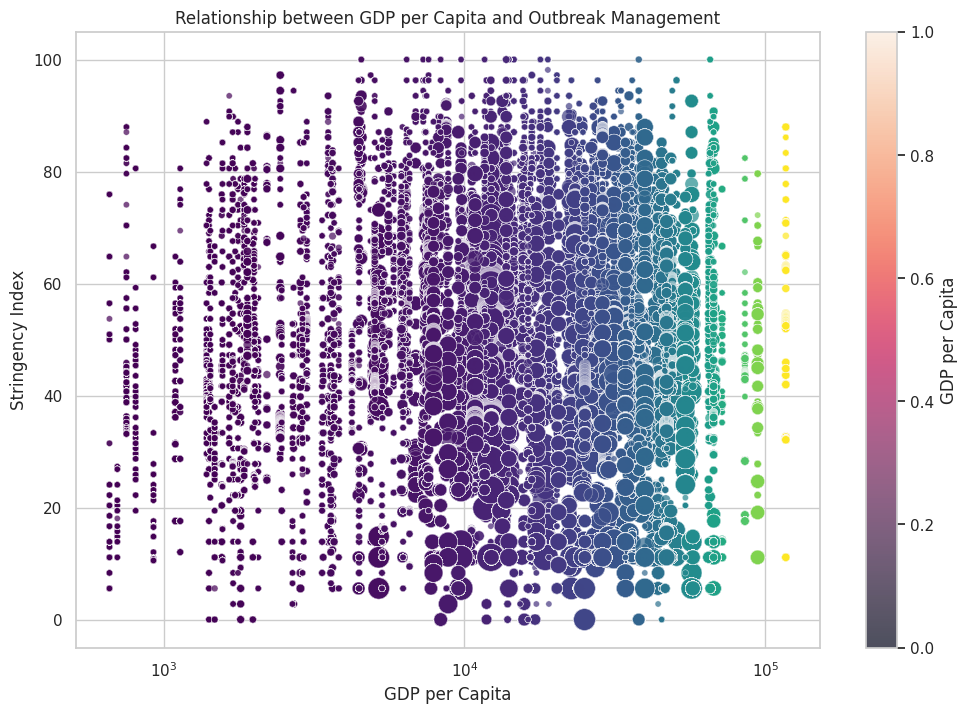

In [115]:

 #Create a scatter plot with bubble sizes based on deaths per million and color gradients based on GDP per capita
plt.figure(figsize=(12, 8))
g = sns.scatterplot(data=data, x='gdp_per_capita', y='stringency_index', size='total_deaths_per_million', hue='gdp_per_capita', sizes=(20, 400), palette='viridis', alpha=0.7)
plt.xscale('log')
plt.title('Relationship between GDP per Capita and Outbreak Management')
plt.xlabel('GDP per Capita')
plt.ylabel('Stringency Index')
plt.legend().remove()

# Add a color legend manually
colorbar = plt.colorbar(g.collections[0])
colorbar.set_label('GDP per Capita')

plt.show()


### Life Expectancy and Pandemic Impact

### Q. How does the average COVID-19 death rate vary across different ranges of life expectancy?

Average COVID-19 Death Rates by Life Expectancy Range:
The grouped bar chart provides insights into how the average COVID-19 death rates change based on different ranges of life expectancy. Here's what the visualization reveals:

X-Axis (Life Expectancy Range): The x-axis represents the ranges of life expectancy, divided into intervals such as "<60," "60-69," "70-79," "80-89," and ">=90." These intervals group countries based on their life expectancy values.
Y-Axis (Average Total Deaths per Million): The y-axis represents the average total deaths per million in each life expectancy range. It quantifies the severity of the COVID-19 outbreak, indicating the average number of deaths per million people in the specified life expectancy interval.

<ipython-input-172-d6690c3598d0>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



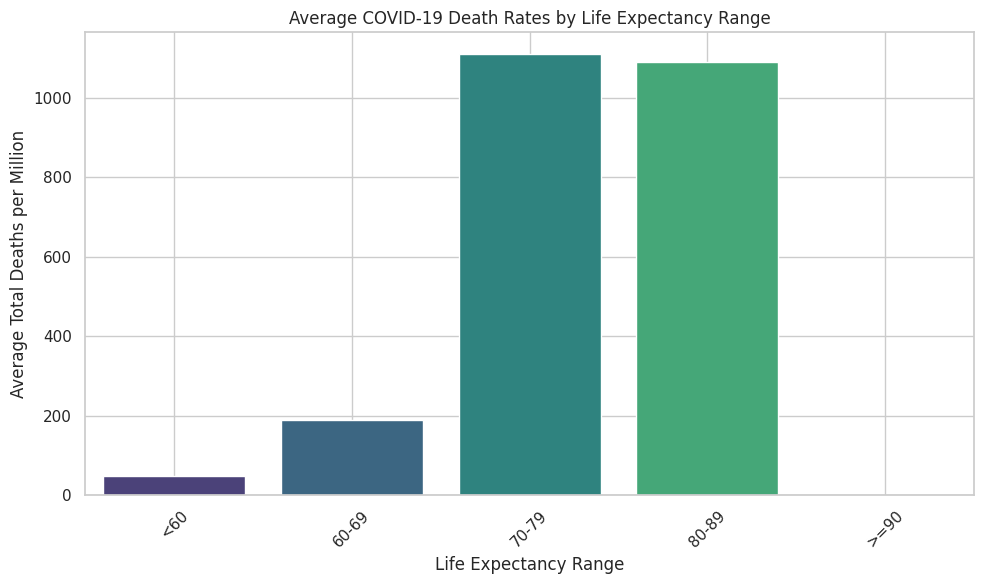

In [172]:
# Filter data to include relevant columns
filtered_data = df.dropna(subset=['location', 'life_expectancy', 'total_deaths_per_million'])

# Define bins for life expectancy ranges
bins = [0, 60, 70, 80, 90, 100]
labels = ['<60', '60-69', '70-79', '80-89', '>=90']
filtered_data['life_expectancy_range'] = pd.cut(filtered_data['life_expectancy'], bins=bins, labels=labels, right=False)

# Calculate the average total deaths per million for each life expectancy range
average_deaths_by_life_expectancy = filtered_data.groupby('life_expectancy_range')['total_deaths_per_million'].mean()

# Create a grouped bar chart
plt.figure(figsize=(10, 6))

sns.barplot(x=average_deaths_by_life_expectancy.index, y=average_deaths_by_life_expectancy.values, palette='viridis')

plt.xlabel('Life Expectancy Range')
plt.ylabel('Average Total Deaths per Million')
plt.title('Average COVID-19 Death Rates by Life Expectancy Range')
plt.xticks(rotation=45)
plt.grid(True)

plt.tight_layout()
plt.show()

### Correlation Matrix for all factors

<ipython-input-116-33f51db5de1c>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.dropna(inplace=True)


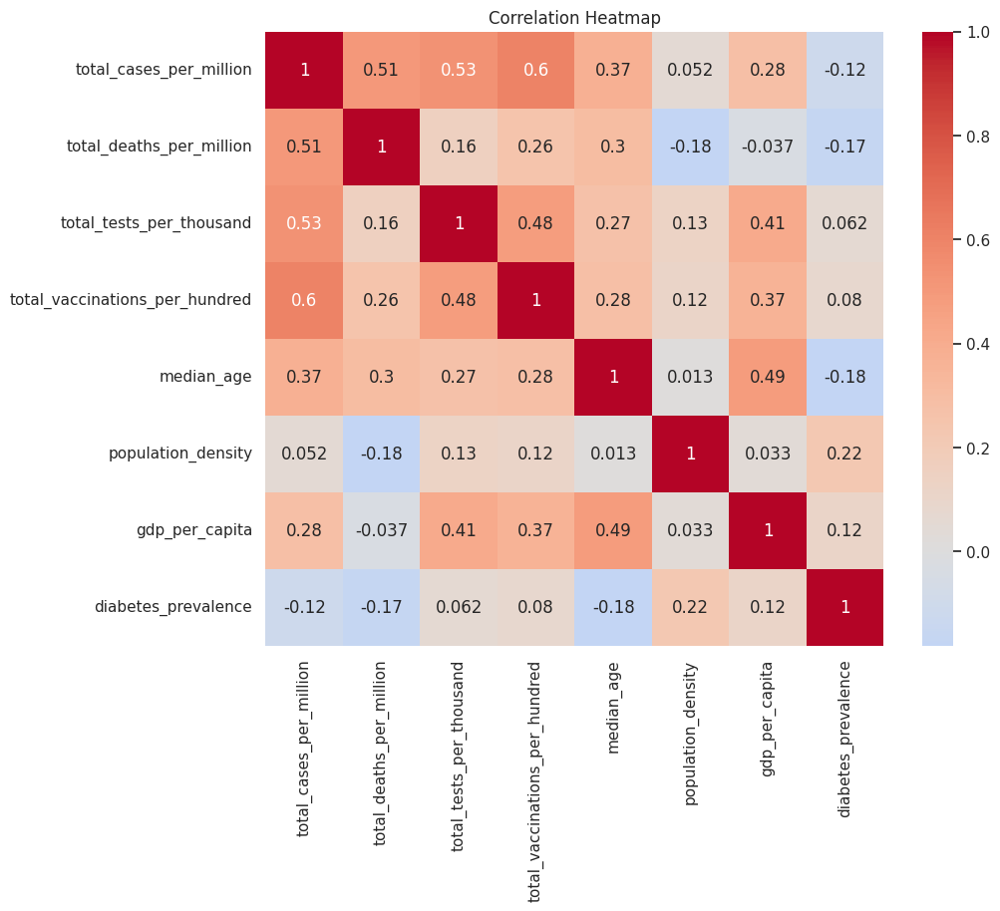

Coefficients: [ 1.49154820e+01  5.79013320e+02  2.28938805e+03 -3.44655446e+00
 -3.62357790e-01 -3.51749615e+03]
Intercept: -27294.528652586087
R-squared: 0.48949515480899075


In [116]:
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr

# Extract relevant columns for analysis
data = df[['total_cases_per_million', 'total_deaths_per_million', 'total_tests_per_thousand', 'total_vaccinations_per_hundred', 'median_age', 'population_density', 'gdp_per_capita', 'diabetes_prevalence']]

# Remove rows with missing values in relevant columns
data.dropna(inplace=True)

# Calculate Pearson correlation coefficients
correlation_matrix = data.corr()

# Plot correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()

# Perform linear regression for selected variables
X = data[['total_tests_per_thousand', 'total_vaccinations_per_hundred', 'median_age', 'population_density', 'gdp_per_capita', 'diabetes_prevalence']]
y = data['total_cases_per_million']

model = LinearRegression()
model.fit(X, y)

# Print coefficients and R-squared
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)
print("R-squared:", model.score(X, y))

